# RECOMMENDATION SYSTEM USING IMDB DATABASE

### 1. IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

import os
os.chdir("D:\\IMDB")

#----------------------------------------------------------------------------------------------------------------------------#

import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline

import plotly_express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

### 2. READING THE DATASETS

In [2]:
df=pd.read_csv("IMDb movies.csv")
ratings=pd.read_csv("IMDb ratings.csv",index_col='imdb_title_id')

### 3. DATA EXPLORATION

In [3]:
df.head()

,imdb_title_id,title,original_title,year,date_published,genre,duration,country,language,director,...,actors,description,avg_vote,votes,budget,usa_gross_income,worlwide_gross_income,metascore,reviews_from_users,reviews_from_critics
0,tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,...,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154,NaN,NaN,NaN,NaN,1.0,2.0
1,tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,...,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589,$ 2250,NaN,NaN,NaN,7.0,7.0
2,tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,...,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188,NaN,NaN,NaN,NaN,5.0,2.0
3,tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,...,"Helen Gardner, Pearl Sindelar, Miss Fielding, ...",The fabled queen of Egypt's affair with Roman ...,5.2,446,$ 45000,NaN,NaN,NaN,25.0,3.0
4,tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",...,"Salvatore Papa, Arturo Pirovano, Giuseppe de L...",Loosely adapted from Dante's Divine Comedy and...,7.0,2237,NaN,NaN,NaN,NaN,31.0,14.0


In [4]:
ratings.head()

,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,votes_5,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0000009,5.9,154,5.9,6.0,12,4,10,43,28,28,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
tt0000574,6.1,589,6.3,6.0,57,18,58,137,139,103,...,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
tt0001892,5.8,188,6.0,6.0,6,6,17,44,52,32,...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002101,5.2,446,5.3,5.0,15,8,16,62,98,117,...,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
tt0002130,7.0,2237,6.9,7.0,210,225,436,641,344,169,...,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85855 entries, 0 to 85854
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   imdb_title_id          85855 non-null  object 
 1   title                  85855 non-null  object 
 2   original_title         85855 non-null  object 
 3   year                   85855 non-null  object 
 4   date_published         85855 non-null  object 
 5   genre                  85855 non-null  object 
 6   duration               85855 non-null  int64  
 7   country                85791 non-null  object 
 8   language               85022 non-null  object 
 9   director               85768 non-null  object 
 10  writer                 84283 non-null  object 
 11  production_company     81400 non-null  object 
 12  actors                 85786 non-null  object 
 13  description            83740 non-null  object 
 14  avg_vote               85855 non-null  float64
 15  vo

In [6]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 85855 entries, tt0000009 to tt9914942
Data columns (total 48 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   weighted_average_vote      85855 non-null  float64
 1   total_votes                85855 non-null  int64  
 2   mean_vote                  85855 non-null  float64
 3   median_vote                85855 non-null  float64
 4   votes_10                   85855 non-null  int64  
 5   votes_9                    85855 non-null  int64  
 6   votes_8                    85855 non-null  int64  
 7   votes_7                    85855 non-null  int64  
 8   votes_6                    85855 non-null  int64  
 9   votes_5                    85855 non-null  int64  
 10  votes_4                    85855 non-null  int64  
 11  votes_3                    85855 non-null  int64  
 12  votes_2                    85855 non-null  int64  
 13  votes_1                    85855 non-nu

In [7]:
df.describe()

,duration,avg_vote,votes,metascore,reviews_from_users,reviews_from_critics
count,85855.000000,85855.000000,8.585500e+04,13305.000000,78258.000000,74058.000000
mean,100.351418,5.898656,9.493490e+03,55.896881,46.040826,27.479989
std,22.553848,1.234987,5.357436e+04,17.784874,178.511411,58.339158
min,41.000000,1.000000,9.900000e+01,1.000000,1.000000,1.000000
25%,88.000000,5.200000,2.050000e+02,43.000000,4.000000,3.000000
50%,96.000000,6.100000,4.840000e+02,57.000000,9.000000,8.000000
75%,108.000000,6.800000,1.766500e+03,69.000000,27.000000,23.000000
max,808.000000,9.900000,2.278845e+06,100.000000,10472.000000,999.000000


In [8]:
ratings.describe()

,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,votes_5,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
count,85855.000000,8.585500e+04,85855.000000,85855.000000,8.585500e+04,85855.000000,85855.000000,85855.000000,85855.000000,85855.000000,...,84911.000000,84911.000000,83057.000000,83057.000000,85176.000000,85176.000000,85646.000000,85646.000000,85854.000000,85854.000000
mean,5.898656,9.493490e+03,6.226342,6.267853,1.216158e+03,1196.774608,2040.896337,2105.668371,1353.192802,700.291177,...,6.071223,685.655451,6.022226,196.065341,5.155706,76.110231,5.925910,1647.822537,5.749638,4332.940865
std,1.234987,5.357436e+04,1.155280,1.481168,1.245582e+04,11735.363316,13801.122865,10699.375191,5976.801303,2931.301270,...,1.454370,3732.376186,1.541895,842.979585,1.290920,124.264020,1.308087,8455.978158,1.285570,23243.807279
min,1.000000,9.900000e+01,1.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,5.200000,2.050000e+02,5.600000,6.000000,2.100000e+01,8.000000,18.000000,28.000000,30.000000,22.000000,...,5.300000,10.000000,5.200000,6.000000,4.400000,11.000000,5.200000,24.000000,5.000000,95.000000
50%,6.100000,4.840000e+02,6.400000,6.000000,5.100000e+01,24.000000,49.000000,77.000000,76.000000,53.000000,...,6.300000,27.000000,6.200000,16.000000,5.300000,29.000000,6.100000,81.000000,6.000000,225.000000
75%,6.800000,1.766500e+03,7.000000,7.000000,1.920000e+02,111.500000,234.000000,342.000000,290.000000,178.000000,...,7.000000,109.000000,7.000000,62.000000,6.000000,77.000000,6.800000,335.000000,6.700000,841.000000
max,9.900000,2.278845e+06,9.800000,10.000000,1.259076e+06,629582.000000,418070.000000,241832.000000,145740.000000,78385.000000,...,10.000000,129249.000000,10.000000,34317.000000,10.000000,928.000000,10.000000,348363.000000,10.000000,887226.000000


### 4.FEATURE ENGINEERING

In [9]:
df.year=df.year.replace('TV Movie 2019',2019).astype(int)
df['primary_genre']=df.genre.apply(lambda x:x.split(',')[0])
df['primary_language']=df.language.dropna().apply(lambda x:x.split(',')[0])
df['primary_country']=df.country.dropna().apply(lambda x:x.split(',')[0])

#### 4.2 FILLING NULL VALUES 

In [10]:
for var in ratings.columns[1:]:
    ratings[var]=ratings[var].fillna(value=ratings[var].median())

In [11]:
ratings.isnull().sum()

weighted_average_vote        0
total_votes                  0
mean_vote                    0
median_vote                  0
votes_10                     0
votes_9                      0
votes_8                      0
votes_7                      0
votes_6                      0
votes_5                      0
votes_4                      0
votes_3                      0
votes_2                      0
votes_1                      0
allgenders_0age_avg_vote     0
allgenders_0age_votes        0
allgenders_18age_avg_vote    0
allgenders_18age_votes       0
allgenders_30age_avg_vote    0
allgenders_30age_votes       0
allgenders_45age_avg_vote    0
allgenders_45age_votes       0
males_allages_avg_vote       0
males_allages_votes          0
males_0age_avg_vote          0
males_0age_votes             0
males_18age_avg_vote         0
males_18age_votes            0
males_30age_avg_vote         0
males_30age_votes            0
males_45age_avg_vote         0
males_45age_votes            0
females_

#### 4.3 CREATING A USER-MOVIE MATRIX

In [12]:
rat_trans=ratings.T
rat_trans.columns=df['original_title']
rat_trans

original_title,Miss Jerry,The Story of the Kelly Gang,Den sorte drøm,Cleopatra,L'Inferno,"From the Manger to the Cross; or, Jesus of Nazareth",Madame DuBarry,Quo Vadis?,Independenta Romaniei,Richard III,...,La reina de los lagartos,Enemy Lines,Ottam,Pengalila,Manoharam,Le lion,De Beentjes van Sint-Hildegard,Padmavyuhathile Abhimanyu,Sokagin Çocuklari,La vida sense la Sara Amat
weighted_average_vote,5.9,6.1,5.8,5.2,7.0,5.7,6.8,6.2,6.7,5.5,...,4.8,5.0,7.4,8.8,6.8,5.3,7.7,7.9,6.4,6.7
total_votes,154.0,589.0,188.0,446.0,2237.0,484.0,753.0,273.0,198.0,225.0,...,103.0,764.0,494.0,553.0,491.0,398.0,724.0,265.0,194.0,102.0
mean_vote,5.9,6.3,6.0,5.3,6.9,5.8,6.8,6.2,7.1,5.4,...,4.9,6.4,7.9,8.5,7.2,5.5,7.9,7.8,9.4,6.8
median_vote,6.0,6.0,6.0,5.0,7.0,6.0,7.0,6.0,7.0,6.0,...,5.0,7.0,9.0,10.0,7.0,6.0,8.0,8.0,10.0,7.0
votes_10,12.0,57.0,6.0,15.0,210.0,33.0,80.0,15.0,53.0,9.0,...,3.0,104.0,185.0,280.0,51.0,13.0,65.0,63.0,176.0,4.0
votes_9,4.0,18.0,6.0,8.0,225.0,15.0,65.0,8.0,7.0,6.0,...,0.0,143.0,82.0,80.0,41.0,9.0,139.0,29.0,0.0,4.0
votes_8,10.0,58.0,17.0,16.0,436.0,48.0,105.0,30.0,23.0,22.0,...,9.0,100.0,81.0,88.0,92.0,26.0,288.0,61.0,2.0,21.0
votes_7,43.0,137.0,44.0,62.0,641.0,80.0,209.0,74.0,35.0,34.0,...,14.0,67.0,44.0,32.0,172.0,65.0,170.0,61.0,2.0,35.0
votes_6,28.0,139.0,52.0,98.0,344.0,123.0,142.0,66.0,30.0,53.0,...,24.0,53.0,13.0,10.0,79.0,104.0,42.0,31.0,1.0,27.0
votes_5,28.0,103.0,32.0,117.0,169.0,77.0,80.0,40.0,24.0,40.0,...,11.0,85.0,35.0,30.0,36.0,86.0,7.0,5.0,0.0,2.0


### 5.DATA VISUALISATION

#### 5.1 SEPARTING CATEGORICAL AND NUMERICAL VARIABLES

In [13]:
categ=[var for var in df.columns if df[var].dtype=='O']
numeric=[var for var in df.columns if df[var].dtype!='O']

In [14]:
base_categ=['primary_genre','primary_language','primary_country','year']

#### 5.2 VISUALISING NUMBER OF MOVIES BY CATEGORIES USING MATPLOTLIB

In [15]:
def visualise_plot_plt():  
    plt.style.use('ggplot')
    plt.figure(figsize=(20,50))
    for num,var in enumerate(base_categ):

        plt.subplot(len(base_categ),2,2*num+1)
        df[var].value_counts()[:15].plot(kind='pie',autopct='%1.1f%%',explode=np.ones(15)*0.1,rotatelabels=True,radius=0.8,shadow=True)
        plt.title("Number of Movies by {}".format(var.capitalize()),weight='bold')
        plt.tick_params(labelsize='x-large')
        plt.axis('off')

        plt.subplot(len(base_categ),2,2*(num+1))
        df[var].value_counts()[:15].plot(kind='bar',color='y',edgecolor='r',linewidth=3)
        plt.grid(True)
        plt.tick_params(grid_color='r',grid_linestyle='-.')

        plt.title("Number of Movies by {}".format(var.capitalize()),weight='bold')
        for k,val in enumerate(df[var].value_counts()[:15]):
            plt.text(x=k-0.33,y=val*1.02,s=val,weight='bold')




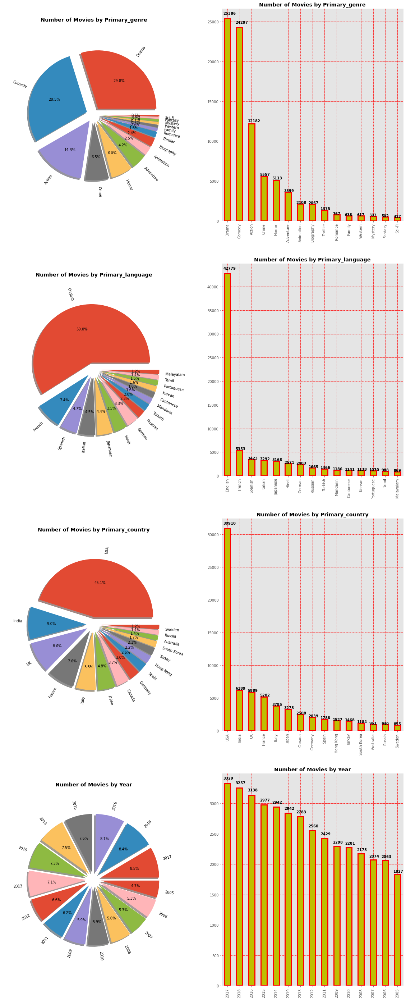

In [16]:
visualise_plot_plt()

#### 5.3 VISUALISING NUMBER OF MOVIES BY CATEGORIES USING PLOTLY

In [17]:
def visualize_plotly():
    fig=make_subplots(rows=4,cols=2,
    specs=[[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}]],
    subplot_titles=['No.of Movies by Country','No.of Movies by Country','No.of Movies by Genre','No.of Movies by Genre','No.of Movies by Language','No.of Movies by Language','No.of Movies by Year','No.of Movies by Year'])

    fig.add_trace(go.Funnel(y=df.primary_country.value_counts()[:15].index,x=df.primary_country.value_counts()[:15].values),1,1)

    fig.add_trace(go.Pie(labels=df.primary_country.value_counts()[:15].index,values=df.primary_country.value_counts()[:15].values,hole=0.5),1,2)

    fig.add_trace(go.Funnel(y=df.primary_genre.value_counts()[:15].index,x=df.primary_genre.value_counts()[:15].values),2,1)

    fig.add_trace(go.Pie(labels=df.primary_genre.value_counts()[:15].index,values=df.primary_genre.value_counts()[:15].values,hole=0.5),2,2)

    fig.add_trace(go.Funnel(y=df.primary_language.value_counts()[:15].index,x=df.primary_language.value_counts()[:15].values),3,1)

    fig.add_trace(go.Pie(labels=df.primary_language.value_counts()[:15].index,values=df.primary_language.value_counts()[:15].values,hole=0.5),3,2)

    fig.add_trace(go.Funnel(y=df.year.value_counts()[:15].index,x=df.year.value_counts()[:15].values),4,1)

    fig.add_trace(go.Pie(labels=df.year.value_counts()[:15].index,values=df.year.value_counts()[:15].values,hole=0.5),4,2)


    fig.update_layout(width=1000,height=2000,showlegend=False)


    fig.show()





In [18]:
visualize_plotly()

#### 5.3 VISUALISING BOX PLOTS AND KDEPLOT 

In [19]:
def box_Ind_World():
    sb.set_style('white')
    plt.figure(figsize=(20,27))

    plt.subplot(3,2,1)
    
    sb.boxplot(x='primary_genre',y='avg_vote',data=df[df.primary_genre.isin(df.primary_genre.value_counts(ascending=False)[:5].index)],linewidth=3,saturation=10)
    plt.title("Genres by Average Vote (World)")
    plt.xlabel("Genres")
    plt.ylabel("Avg Vote")

    
    plt.subplot(3,2,2)
    
    sb.boxplot(x='primary_genre',y='avg_vote',data=df[df.primary_genre.isin(df[df.primary_country=='India'].primary_genre.value_counts(ascending=False)[:5].index)],linewidth=3,saturation=5)
    plt.title("Genres by Average Vote (India)")
    plt.xlabel("Genres")
    plt.ylabel("Avg Vote")
    
    
    
    plt.subplot(3,2,3)
    
    sb.boxplot(x='primary_language',y='avg_vote',data=df[df.primary_language.isin(df.primary_language.value_counts(ascending=False)[:5].index)],linewidth=3,saturation=5)
    plt.title("Languages by Average Vote (World)")
    plt.xlabel("Languages")
    plt.ylabel("Avg Vote")
    
    
    
    plt.subplot(3,2,4)
    
    sb.boxplot(x='primary_language',y='avg_vote',data=df[df.primary_language.isin(df[df.primary_country=='India'].primary_language.value_counts(ascending=False)[:5].index)],linewidth=3,saturation=5)
    plt.title("Languages by Average Vote (India)")
    plt.xlabel("Languages")
    plt.ylabel("Avg Vote")
    
    
    plt.subplot(3,2,5)
    sb.kdeplot(df.avg_vote,df.votes)
    plt.ylim(0,100000)
    plt.xlim(2,9)
    plt.title("Average vs Total Votes")
    plt.xlabel("Avg Vote")
    plt.ylabel("Total Votes")
    
    
        
    plt.subplot(3,2,6)
    sb.kdeplot(df[df.primary_country=='India'].avg_vote,df[df.primary_country=='India'].votes)
    plt.ylim(0,20000)
    plt.xlim(2,9)
    plt.title("Average vs Total Votes (India)")
    plt.xlabel("Avg Vote")
    plt.ylabel("Total Votes")

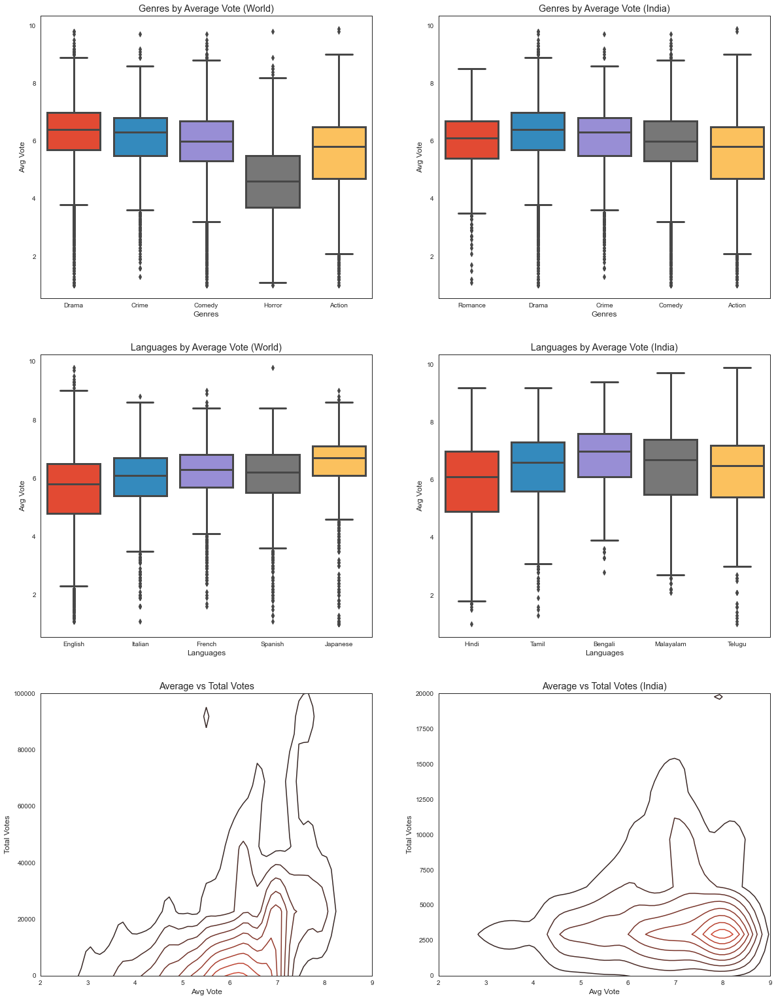

In [20]:
box_Ind_World()

#### 5.4 MOVIES IN INDIA BY VOTING SPECTRUM

Text(0, 0.5, 'Total Votes')

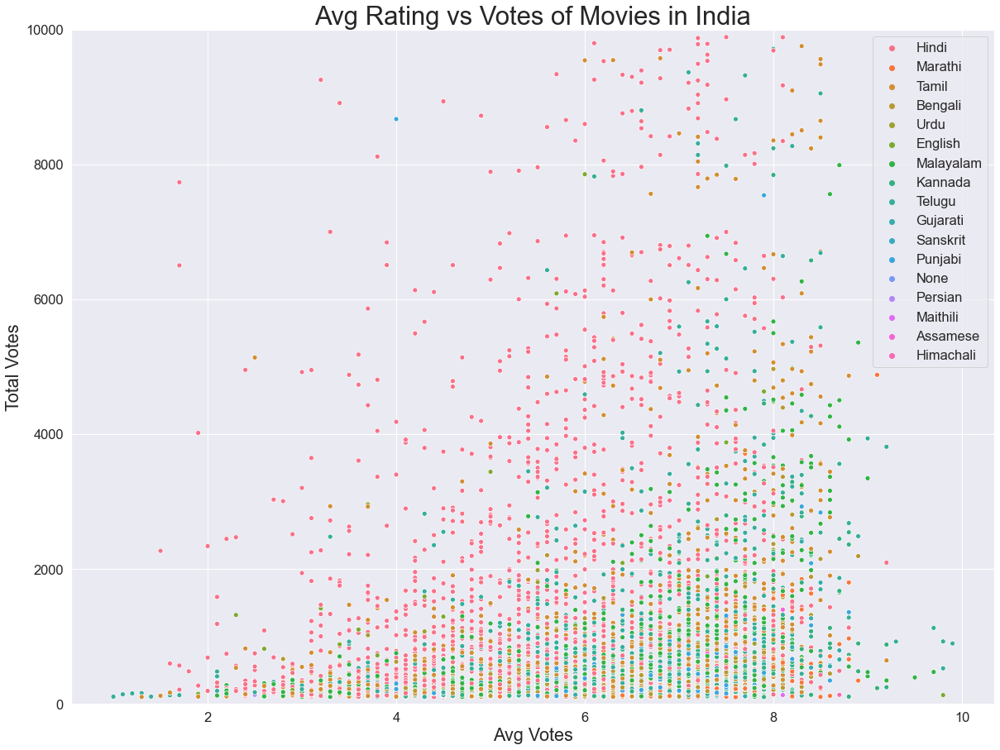

In [21]:
plt.figure(figsize=(20,15))
sb.set(font_scale=1.5)
sb.scatterplot(df[df.country=='India'].avg_vote,df[df.country=='India'].votes,hue=df[df.country=='India'].primary_language.to_list())
plt.ylim(0,10000)
plt.legend(loc=1)
plt.title("Avg Rating vs Votes of Movies in India",fontsize='xx-large')
plt.xlabel("Avg Votes",fontsize='large')
plt.ylabel("Total Votes",fontsize='large')


#### 5.5 NO. OF MOVIES BY LANGUAGE IN INDIA (PLOTLY)

In [22]:
px.funnel(df[df.country=='India'].primary_language.value_counts(),title="No of Movies by Language in India")

#### 5.6 NUMBER OF MOVIES IN EACH LANGUAGE  BY GENRE

In [23]:
px.histogram(data_frame=df,y='primary_country',color='primary_genre',height=800,width=900,title='No. of Movies in Each Language by Genre')


#### 5.7 NUMBER OF MOVIES IN EACH LANGUAGE  BY GENRE IN INDIA

In [24]:
px.histogram(data_frame=df[df.country=='India'],y='primary_language',color='primary_genre',height=768,width=900,title='No. of Movies in Each Language by Genre in India')

#### 5.8 NUMBER OF MOVIES IN EACH LANGUAGE BY GENRE (SUNBURST)

In [25]:
px.sunburst(df.fillna('None'),path=['primary_country','primary_language','primary_genre'],
            height=700,width=700,title='No. of Movies in Each Language by Genre')

#### 5.9 NUMBER OF MOVIES IN EACH LANGUAGE BY GENRE IN INDIA (SUNBURST)

In [26]:
px.sunburst(df[df.country=='India'].fillna('None'),path=['primary_language','primary_genre'],
            height=700,width=700,title='No. of Movies in Each Language by Genre in India')

#### 5.10 GEO SCATTERPLOT BY NUMBER OF MOVIES

In [27]:
px.scatter_geo(locationmode='country names',locations=df['primary_country'].value_counts().index,size=df['primary_country'].value_counts(),
projection='kavrayskiy7',width=1000,color=df['primary_country'].value_counts().index)

#### 5.11 GEO SCATTERPLOT BY NUMBER OF AVERAGE MOVIE RATINGS

In [28]:
px.choropleth(locationmode='country names',locations=df['primary_country'].value_counts().index,
projection='kavrayskiy7',width=1000,color=df.groupby('primary_country')['avg_vote'].median())

In [29]:
# SELECTED NUMBER OF COUNTRIES
C=['India','USA','UK','France','Japan','Spain','Germany','Mexico']

#### 5.12 POLAR SCATTERPLOT FOR MOVIES BY LANGUAGE AND AVG VOTES

In [30]:
px.scatter_polar(data_frame=df[df.primary_country.isin(C)],theta='primary_language',r='avg_vote',color='primary_genre',symbol='primary_genre',animation_frame='primary_country')

### 6. Recommendation System

In [31]:
def get_recommendations_for(title,n=10):
    if (len(title.split())==1):
        title=title.capitalize()
    else:
        pass
    
    top=rat_trans.corrwith(rat_trans[title]).sort_values(ascending=False)[1:n+1]
    print('='*125)
    print('='*125)
    print(f" Name: {df[df.original_title==title]['original_title'].values[0]}")
    print(f" Cast: {df[df.original_title==title]['actors'].values[0]}")
    print(f" Language: {df[df.original_title==title]['language'].values[0]}")
    print(f" Genre: {df[df.original_title==title]['genre'].values[0]}")
    print(f" Year: {df[df.original_title==title]['year'].values[0]}")
    print(f" Description: {df[df.original_title==title]['description'].values[0]}")
    print('='*125)
    print('*'*125)
    
    for num,t in enumerate(top.index):
        
        print('='*125)
        print('|' + ' '*123+'|')
        
        print(f"| {num+1}) Movie Name: {df[df.original_title==t]['original_title'].values[0]}")
        print(f"| Director: {df[df.original_title==t]['director'].values[0]}")
        print(f"| Cast: {df[df.original_title==t]['actors'].values[0]}")
        print(f"| Language: {df[df.original_title==t]['language'].values[0]}")
        print(f"| Genre: {df[df.original_title==t]['genre'].values[0]}")
        print(f"| Year: {df[df.original_title==t]['year'].values[0]}")
        print(f"| Country: {df[df.original_title==t]['country'].values[0]}")
        print(f"| Description: {df[df.original_title==t]['description'].values[0]}")
        print(f"| Rating: {df[df.original_title==t]['avg_vote'].values[0]}")
        print(f"| Total Votes: {df[df.original_title==t]['votes'].values[0]}")
    
        print('|' + ' '*123+'|')
        print('='*125)
        print('-'*125)
    
    plt.figure(figsize=(15,n))
    plt.tick_params()
    top.plot(kind='barh')
    plt.ylabel("Movie Name")
    plt.title("Correlation Score",fontsize='xx-large')
    for N,t in enumerate(top):
        plt.text(x=t+0.01,y=N-0.1,s=round(t,3)*100)

 Name: Shutter Island
 Cast: Leonardo DiCaprio, Mark Ruffalo, Ben Kingsley, Max von Sydow, Michelle Williams, Emily Mortimer, Patricia Clarkson, Jackie Earle Haley, Ted Levine, John Carroll Lynch, Elias Koteas, Robin Bartlett, Christopher Denham, Nellie Sciutto, Joseph Sikora
 Language: English, German
 Genre: Mystery, Thriller
 Year: 2010
 Description: In 1954, a U.S. Marshal investigates the disappearance of a murderer who escaped from a hospital for the criminally insane.
*****************************************************************************************************************************
|                                                                                                                           |
| 1) Movie Name: 12 Years a Slave
| Director: Steve McQueen
| Cast: Chiwetel Ejiofor, Dwight Henry, Dickie Gravois, Bryan Batt, Ashley Dyke, Kelsey Scott, Quvenzhané Wallis, Cameron Zeigler, Tony Bentley, Scoot McNairy, Taran Killam, Christopher Berry, Bill Camp, Mist

| 7) Movie Name: Pâfekuto burû
| Director: Satoshi Kon
| Cast: Junko Iwao, Rica Matsumoto, Shinpachi Tsuji, Masaaki Ôkura, Yôsuke Akimoto, Yoku Shioya, Hideyuki Hori, Emi Shinohara, Masashi Ebara, Kiyoyuki Yanada, Tôru Furusawa, Shiho Niiyama, Emiko Furukawa, Aya Hara, Shin'ichirô Miki
| Language: Japanese
| Genre: Animation, Crime, Mystery
| Year: 1997
| Country: Japan
| Description: A pop singer gives up her career to become an actress, but she slowly goes insane when she starts being stalked by an obsessed fan and what seems to be a ghost of her past.
| Rating: 8.0
| Total Votes: 54174
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| 8) Movie Name: Ah-ga-ssi

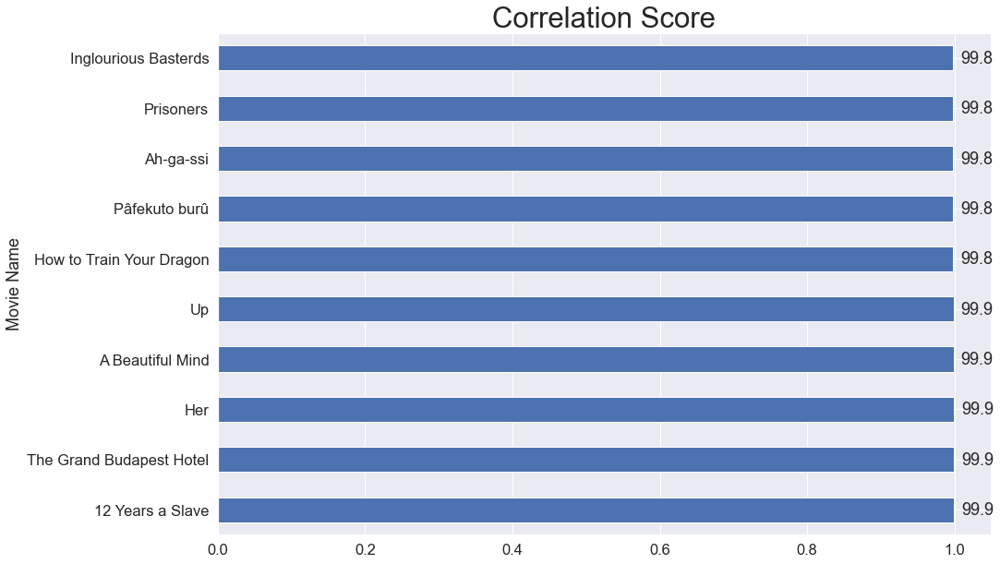

In [33]:
get_recommendations_for('Shutter Island')

## -----------------------------------------------------------END----------------------------------------------------------------